# Summary csv analysis on RL3210 and RL3294 and RL3295 and RL4632
## Peaks were called on RL3210 for sample cell calling
## Analysis is done on filtered cells by cellranger

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:

summary_path = '/home/dmakosa/working_data_02/snoverATAC/RL3294_RL3295/cellranger_output/summary_csvs/combined_summary.csv'
# Read in the dependencies
summary = pd.read_csv(summary_path, sep = ',')

summary = summary.loc[~summary['Sample ID'].str.contains('bulk', case=False)]

In [3]:
summary[['RL', 'WellNumber', 'NucleiPurification', 'TagBuffer','TagTemp', 'MErev', 'Tn5conc']] = summary['Sample ID'].str.split("_", expand = True)
summary

,Sample ID,Genome,Pipeline version,Estimated number of cells (GRCh38),Estimated number of cells (mm10),Confidently mapped read pairs,Estimated bulk library complexity,Fraction of genome in peaks,Fraction of high-quality fragments in cells,Fraction of high-quality fragments overlapping TSS (GRCh38),...,TSS enrichment score,Unmapped read pairs,Valid barcodes,RL,WellNumber,NucleiPurification,TagBuffer,TagTemp,MErev,Tn5conc
0,RL3294_01_dirty_THS_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,173,214,0.8217,663491.5,0.0557,0.1831,0.1936,...,16.0000,0.0295,0.9876,RL3294,01,dirty,THS,30,shortREV,lowTn5
1,RL3294_02_dirty_THS_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,533,450,0.8340,2769810.3,0.0557,0.2983,0.2304,...,6.8095,0.0227,0.9877,RL3294,02,dirty,THS,30,shortREV,mediumTn5
2,RL3294_03_dirty_THS_30_shortREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,363,312,0.8354,3593388.6,0.0557,0.2372,0.2231,...,6.0508,0.0209,0.9882,RL3294,03,dirty,THS,30,shortREV,highTn5
3,RL3294_04_dirty_OMNI_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,55,175,0.8195,715150.0,0.0557,0.0929,0.1654,...,15.2500,0.0292,0.9886,RL3294,04,dirty,OMNI,30,shortREV,lowTn5
4,RL3294_05_dirty_OMNI_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,385,254,0.8313,2406486.4,0.0557,0.1207,0.1767,...,7.4000,0.0276,0.9873,RL3294,05,dirty,OMNI,30,shortREV,mediumTn5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,RL3210_92_sucrose_THS_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,568,406,0.8685,15955129.2,0.0557,0.7022,0.2357,...,8.1805,0.0264,0.9838,RL3210,92,sucrose,THS,37,blockedREV,mediumTn5
284,RL3210_93_sucrose_THS_37_blockedREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,574,428,0.8569,15049604.0,0.0557,0.7216,0.2471,...,8.2376,0.0384,0.9881,RL3210,93,sucrose,THS,37,blockedREV,highTn5
285,RL3210_94_sucrose_OMNI_37_blockedREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,657,495,0.8646,11053132.2,0.0557,0.7928,0.2182,...,8.1131,0.0319,0.9874,RL3210,94,sucrose,OMNI,37,blockedREV,lowTn5
286,RL3210_95_sucrose_OMNI_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,673,467,0.8686,16004599.0,0.0557,0.8373,0.2267,...,8.1787,0.0282,0.9870,RL3210,95,sucrose,OMNI,37,blockedREV,mediumTn5


In [4]:
summary['condition'] = summary['NucleiPurification'] + '_' + summary['TagBuffer'] + '_'  + summary['TagTemp'] + '_'  + summary['MErev'] + '_'  + summary['Tn5conc']

In [5]:
summary['condition2'] = summary['NucleiPurification'] + '_' + summary['TagBuffer'] + '_'  + summary['TagTemp'] + '_'  + summary['Tn5conc']

In [6]:
summary

,Sample ID,Genome,Pipeline version,Estimated number of cells (GRCh38),Estimated number of cells (mm10),Confidently mapped read pairs,Estimated bulk library complexity,Fraction of genome in peaks,Fraction of high-quality fragments in cells,Fraction of high-quality fragments overlapping TSS (GRCh38),...,Valid barcodes,RL,WellNumber,NucleiPurification,TagBuffer,TagTemp,MErev,Tn5conc,condition,condition2
0,RL3294_01_dirty_THS_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,173,214,0.8217,663491.5,0.0557,0.1831,0.1936,...,0.9876,RL3294,01,dirty,THS,30,shortREV,lowTn5,dirty_THS_30_shortREV_lowTn5,dirty_THS_30_lowTn5
1,RL3294_02_dirty_THS_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,533,450,0.8340,2769810.3,0.0557,0.2983,0.2304,...,0.9877,RL3294,02,dirty,THS,30,shortREV,mediumTn5,dirty_THS_30_shortREV_mediumTn5,dirty_THS_30_mediumTn5
2,RL3294_03_dirty_THS_30_shortREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,363,312,0.8354,3593388.6,0.0557,0.2372,0.2231,...,0.9882,RL3294,03,dirty,THS,30,shortREV,highTn5,dirty_THS_30_shortREV_highTn5,dirty_THS_30_highTn5
3,RL3294_04_dirty_OMNI_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,55,175,0.8195,715150.0,0.0557,0.0929,0.1654,...,0.9886,RL3294,04,dirty,OMNI,30,shortREV,lowTn5,dirty_OMNI_30_shortREV_lowTn5,dirty_OMNI_30_lowTn5
4,RL3294_05_dirty_OMNI_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,385,254,0.8313,2406486.4,0.0557,0.1207,0.1767,...,0.9873,RL3294,05,dirty,OMNI,30,shortREV,mediumTn5,dirty_OMNI_30_shortREV_mediumTn5,dirty_OMNI_30_mediumTn5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,RL3210_92_sucrose_THS_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,568,406,0.8685,15955129.2,0.0557,0.7022,0.2357,...,0.9838,RL3210,92,sucrose,THS,37,blockedREV,mediumTn5,sucrose_THS_37_blockedREV_mediumTn5,sucrose_THS_37_mediumTn5
284,RL3210_93_sucrose_THS_37_blockedREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,574,428,0.8569,15049604.0,0.0557,0.7216,0.2471,...,0.9881,RL3210,93,sucrose,THS,37,blockedREV,highTn5,sucrose_THS_37_blockedREV_highTn5,sucrose_THS_37_highTn5
285,RL3210_94_sucrose_OMNI_37_blockedREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,657,495,0.8646,11053132.2,0.0557,0.7928,0.2182,...,0.9874,RL3210,94,sucrose,OMNI,37,blockedREV,lowTn5,sucrose_OMNI_37_blockedREV_lowTn5,sucrose_OMNI_37_lowTn5
286,RL3210_95_sucrose_OMNI_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,673,467,0.8686,16004599.0,0.0557,0.8373,0.2267,...,0.9870,RL3210,95,sucrose,OMNI,37,blockedREV,mediumTn5,sucrose_OMNI_37_blockedREV_mediumTn5,sucrose_OMNI_37_mediumTn5


In [7]:
summary.columns

Index(['Sample ID', 'Genome', 'Pipeline version',
       'Estimated number of cells (GRCh38)',
       'Estimated number of cells (mm10)', 'Confidently mapped read pairs',
       'Estimated bulk library complexity', 'Fraction of genome in peaks',
       'Fraction of high-quality fragments in cells',
       'Fraction of high-quality fragments overlapping TSS (GRCh38)',
       'Fraction of high-quality fragments overlapping TSS (mm10)',
       'Fraction of high-quality fragments overlapping peaks (GRCh38)',
       'Fraction of high-quality fragments overlapping peaks (mm10)',
       'Fraction of transposition events in peaks in cells',
       'Fragments flanking a single nucleosome',
       'Fragments in nucleosome-free regions', 'Inferred multiplet rate',
       'Mean raw read pairs per cell (GRCh38)',
       'Mean raw read pairs per cell (mm10)', 'Median barcode purity (GRCh38)',
       'Median barcode purity (mm10)',
       'Median high-quality fragments per cell (GRCh38)',
       'Med

/home/dmakosa/working_data_01/apps/miniconda3/envs/snRNAseq/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  


AxesSubplot(0.125,0.125;0.775x0.755)


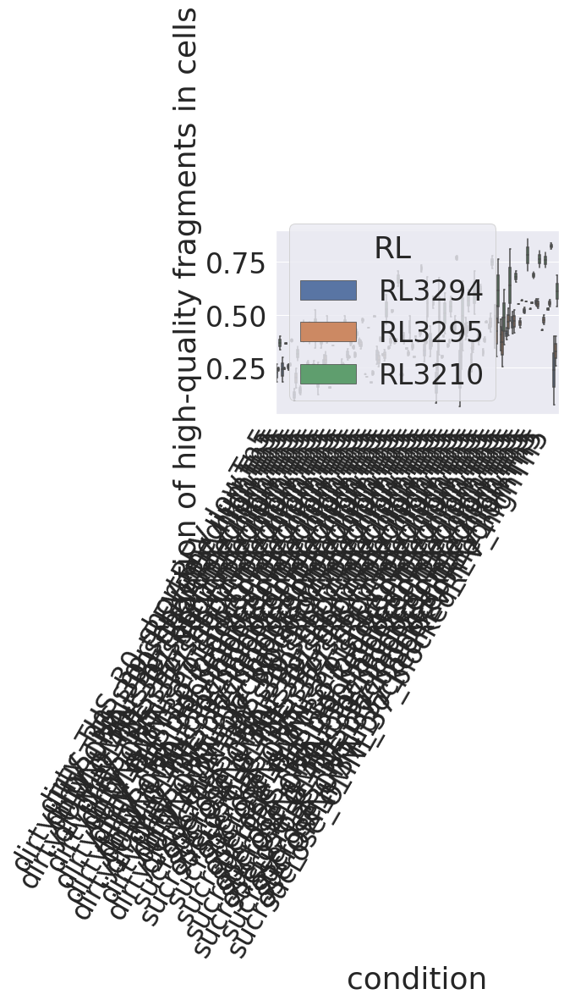

In [8]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments in cells', hue = 'RL')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0831284,0.334832;0.906072x0.647168)


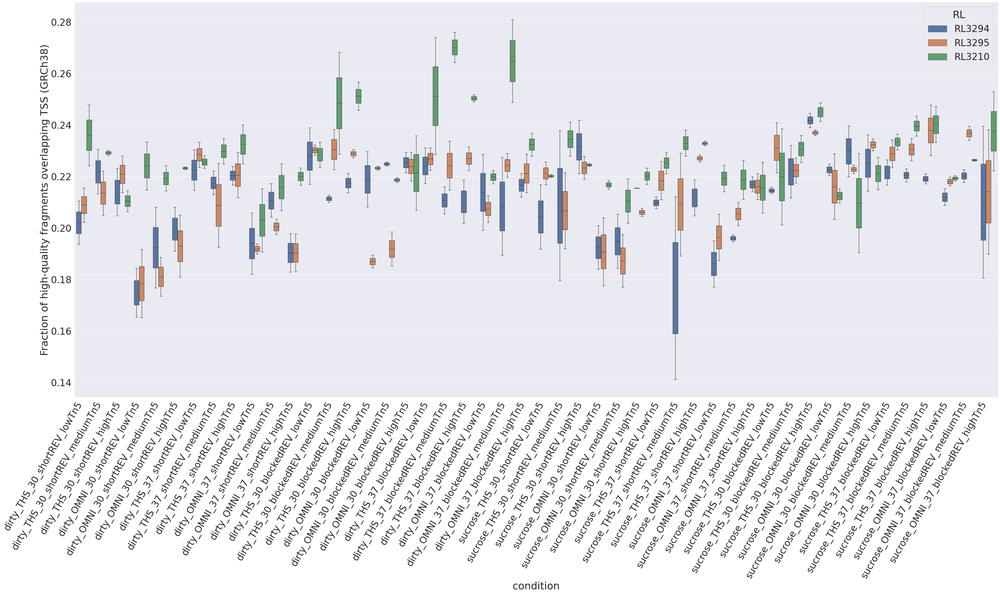

In [9]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments overlapping TSS (GRCh38)', hue = 'RL')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0831284,0.334832;0.906072x0.647168)


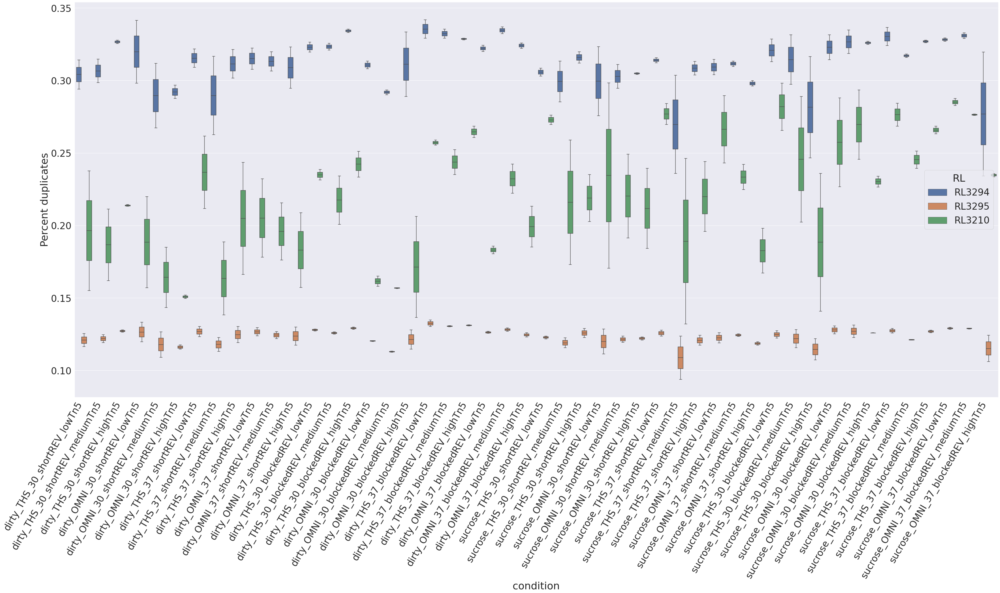

In [10]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Percent duplicates', hue = 'RL')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0831284,0.334832;0.906072x0.647168)


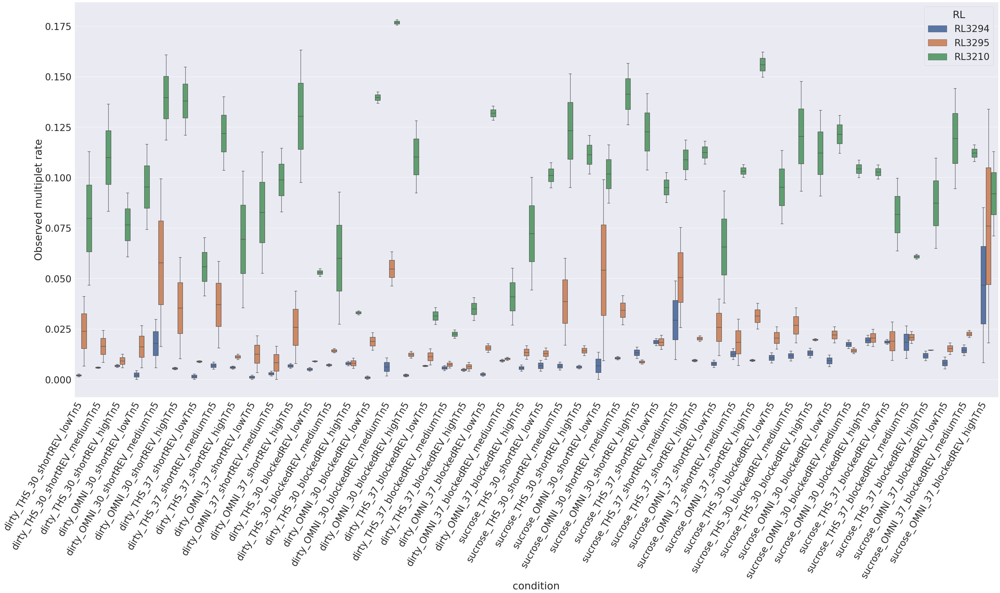

In [11]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Observed multiplet rate', hue = 'RL')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


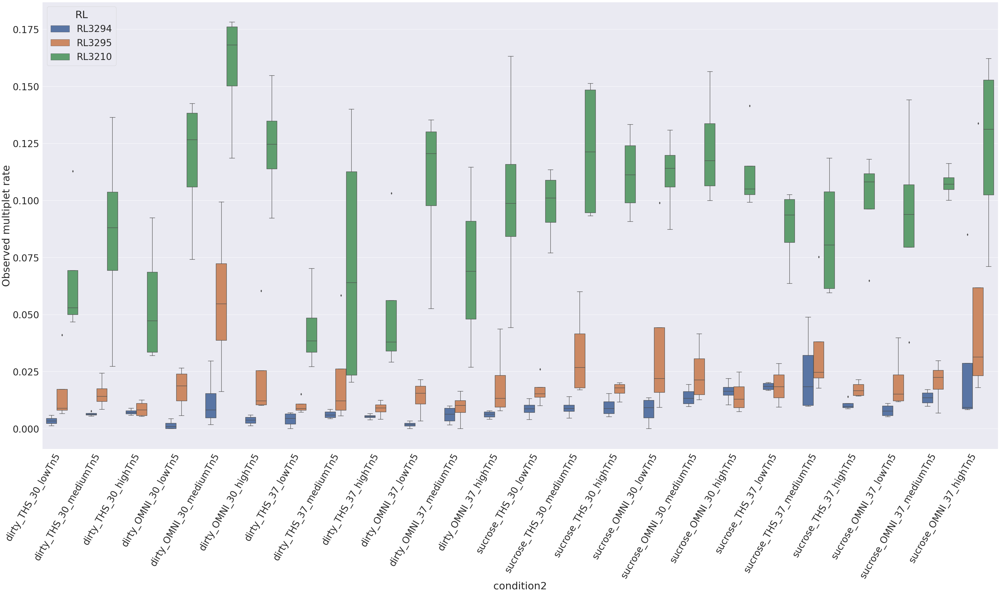

In [12]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition2", y = 'Observed multiplet rate', hue = 'RL')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

In [26]:
subset = summary.loc[summary['RL'].str.contains('RL3295', case=False)]

In [27]:
subset

,Sample ID,Genome,Pipeline version,Estimated number of cells (GRCh38),Estimated number of cells (mm10),Confidently mapped read pairs,Estimated bulk library complexity,Fraction of genome in peaks,Fraction of high-quality fragments in cells,Fraction of high-quality fragments overlapping TSS (GRCh38),...,Valid barcodes,RL,WellNumber,NucleiPurification,TagBuffer,TagTemp,MErev,Tn5conc,condition,condition2
96,RL3295_01_dirty_THS_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,438,633,0.8201,NaN,0.0557,0.2349,0.2022,...,0.9888,RL3295,01,dirty,THS,30,shortREV,lowTn5,dirty_THS_30_shortREV_lowTn5,dirty_THS_30_lowTn5
97,RL3295_02_dirty_THS_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,497,455,0.8279,NaN,0.0557,0.2494,0.2222,...,0.9880,RL3295,02,dirty,THS,30,shortREV,mediumTn5,dirty_THS_30_shortREV_mediumTn5,dirty_THS_30_mediumTn5
98,RL3295_03_dirty_THS_30_shortREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,418,444,0.8299,NaN,0.0557,0.2589,0.2279,...,0.9886,RL3295,03,dirty,THS,30,shortREV,highTn5,dirty_THS_30_shortREV_highTn5,dirty_THS_30_highTn5
99,RL3295_04_dirty_OMNI_30_shortREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,330,310,0.8160,NaN,0.0557,0.1550,0.1651,...,0.9890,RL3295,04,dirty,OMNI,30,shortREV,lowTn5,dirty_OMNI_30_shortREV_lowTn5,dirty_OMNI_30_lowTn5
100,RL3295_05_dirty_OMNI_30_shortREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,1896,974,0.8298,NaN,0.0557,0.2583,0.1735,...,0.9884,RL3295,05,dirty,OMNI,30,shortREV,mediumTn5,dirty_OMNI_30_shortREV_mediumTn5,dirty_OMNI_30_mediumTn5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,RL3295_92_sucrose_THS_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,970,599,0.8615,NaN,0.0557,0.5543,0.2347,...,0.9873,RL3295,92,sucrose,THS,37,blockedREV,mediumTn5,sucrose_THS_37_blockedREV_mediumTn5,sucrose_THS_37_mediumTn5
188,RL3295_93_sucrose_THS_37_blockedREV_highTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,819,555,0.8464,NaN,0.0557,0.5288,0.2476,...,0.9895,RL3295,93,sucrose,THS,37,blockedREV,highTn5,sucrose_THS_37_blockedREV_highTn5,sucrose_THS_37_highTn5
189,RL3295_94_sucrose_OMNI_37_blockedREV_lowTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,488,507,0.8563,NaN,0.0557,0.4535,0.2163,...,0.9889,RL3295,94,sucrose,OMNI,37,blockedREV,lowTn5,sucrose_OMNI_37_blockedREV_lowTn5,sucrose_OMNI_37_lowTn5
190,RL3295_95_sucrose_OMNI_37_blockedREV_mediumTn5,GRCh38_and_mm10,cellranger-atac-2.0.0,782,538,0.8586,NaN,0.0557,0.5374,0.2395,...,0.9886,RL3295,95,sucrose,OMNI,37,blockedREV,mediumTn5,sucrose_OMNI_37_blockedREV_mediumTn5,sucrose_OMNI_37_mediumTn5


AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


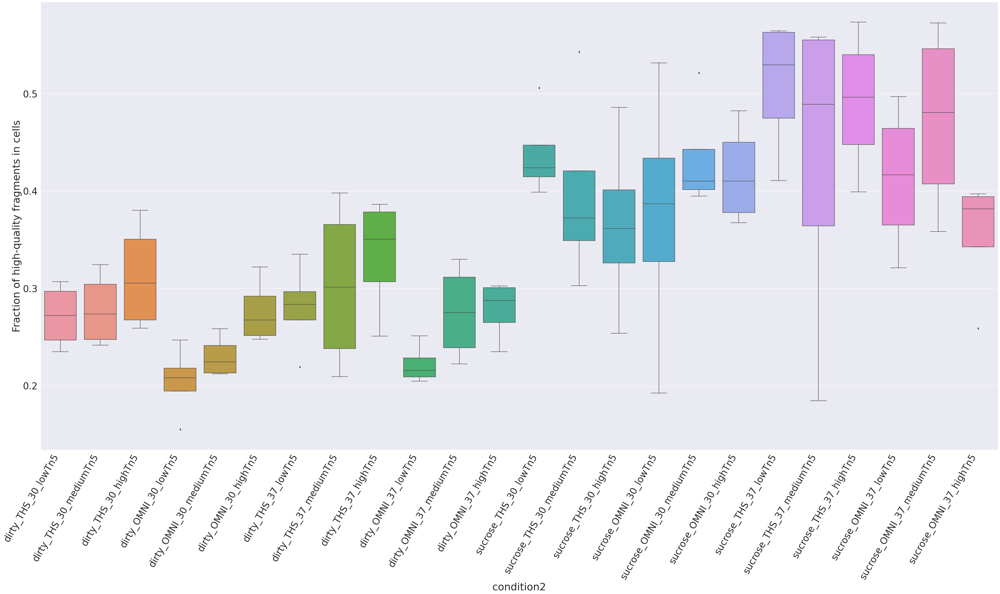

In [28]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Fraction of high-quality fragments in cells')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


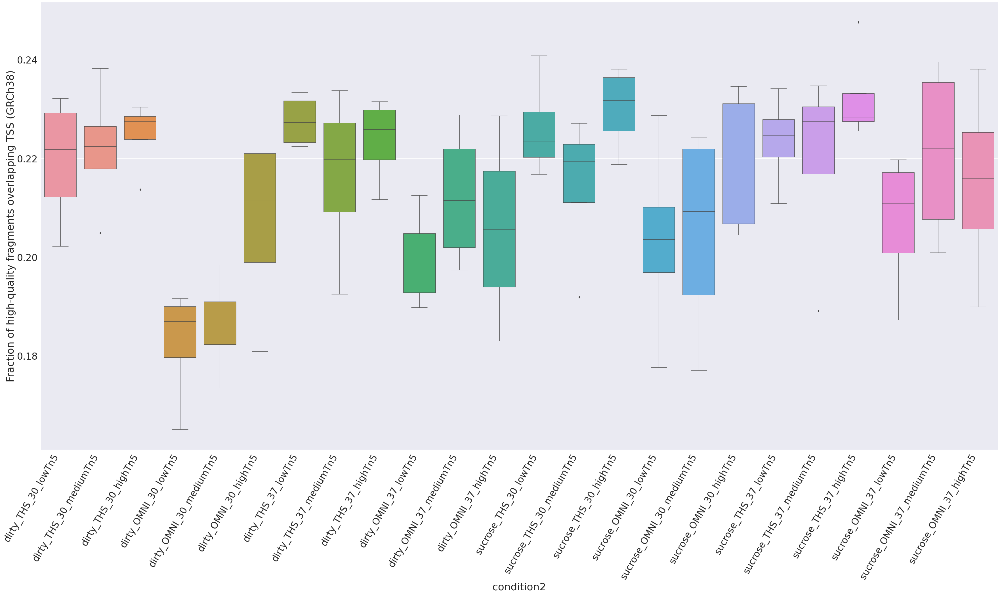

In [29]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Fraction of high-quality fragments overlapping TSS (GRCh38)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


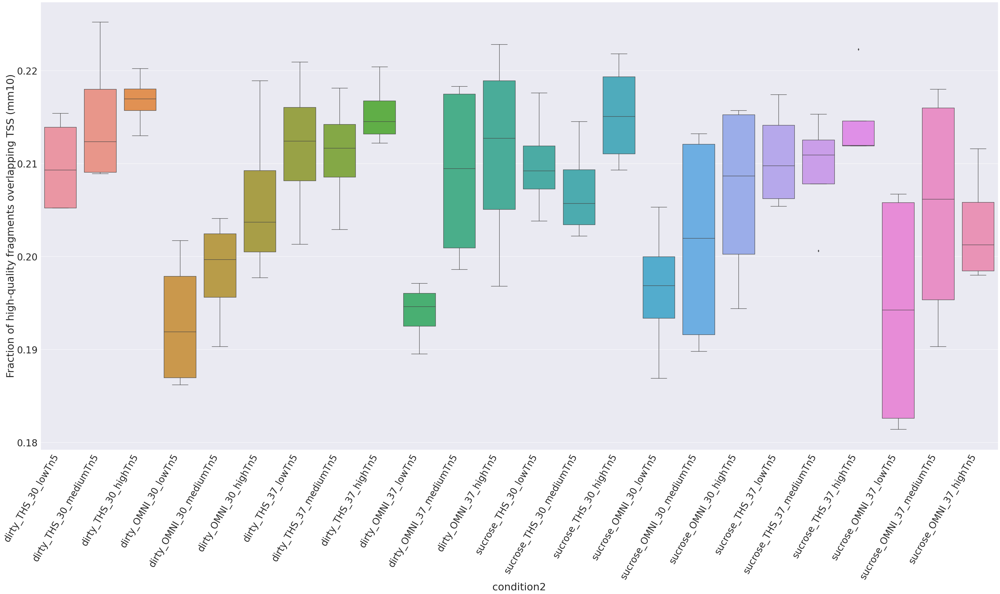

In [30]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Fraction of high-quality fragments overlapping TSS (mm10)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


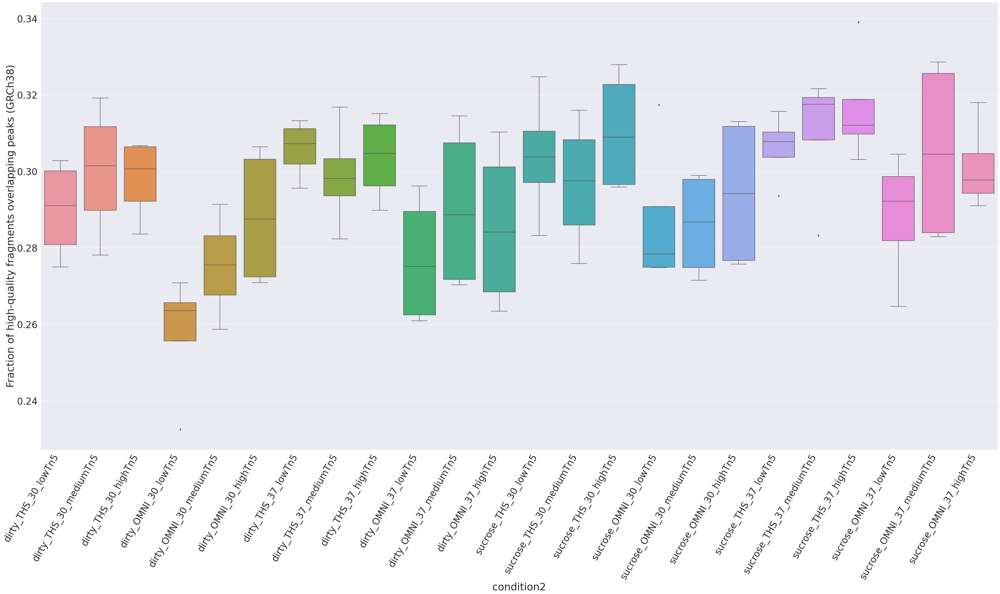

In [31]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Fraction of high-quality fragments overlapping peaks (GRCh38)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


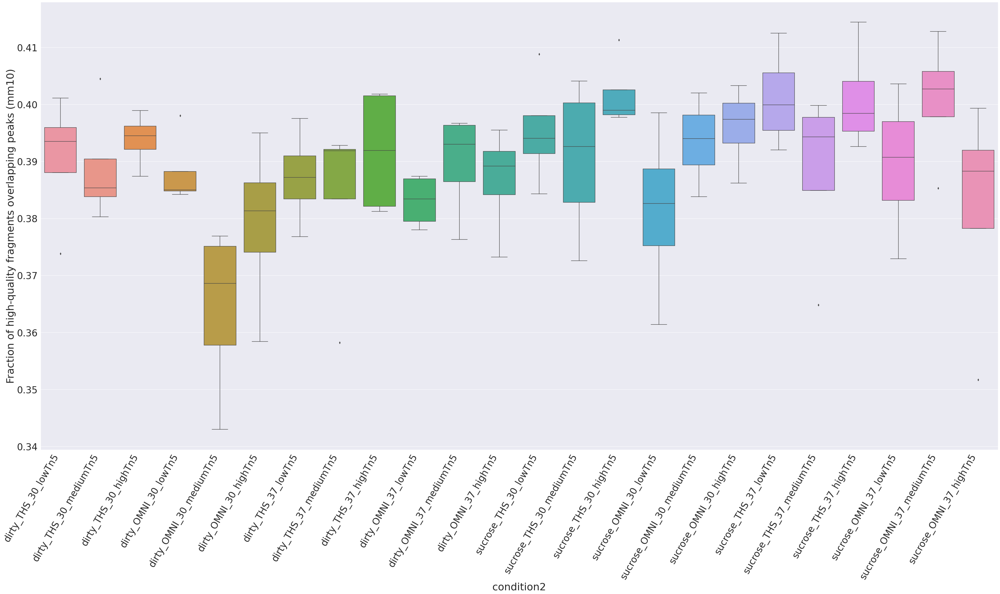

In [32]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Fraction of high-quality fragments overlapping peaks (mm10)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0502097,0.0978471;0.93899x0.884153)


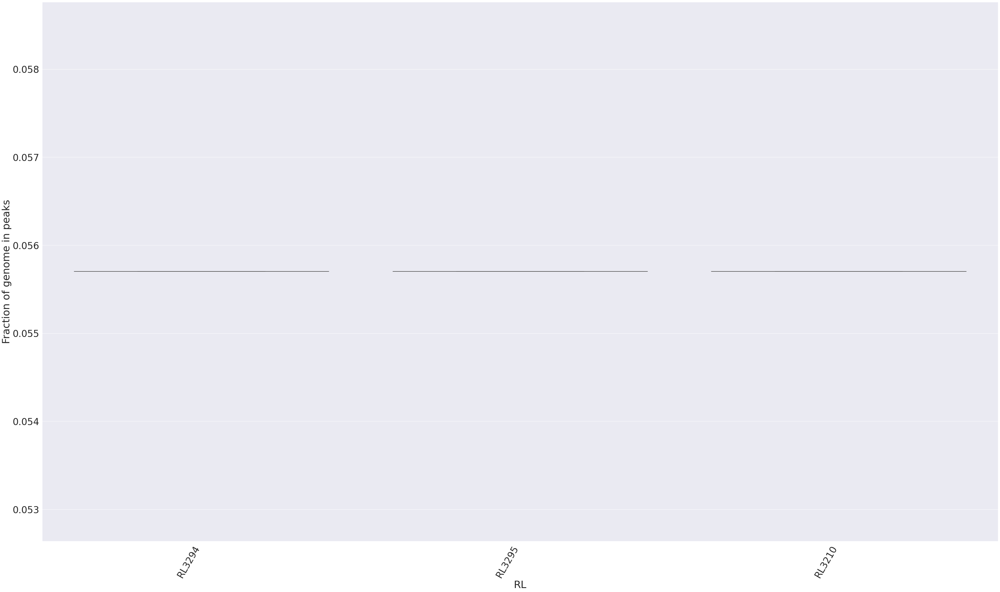

In [33]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "RL", y = 'Fraction of genome in peaks')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


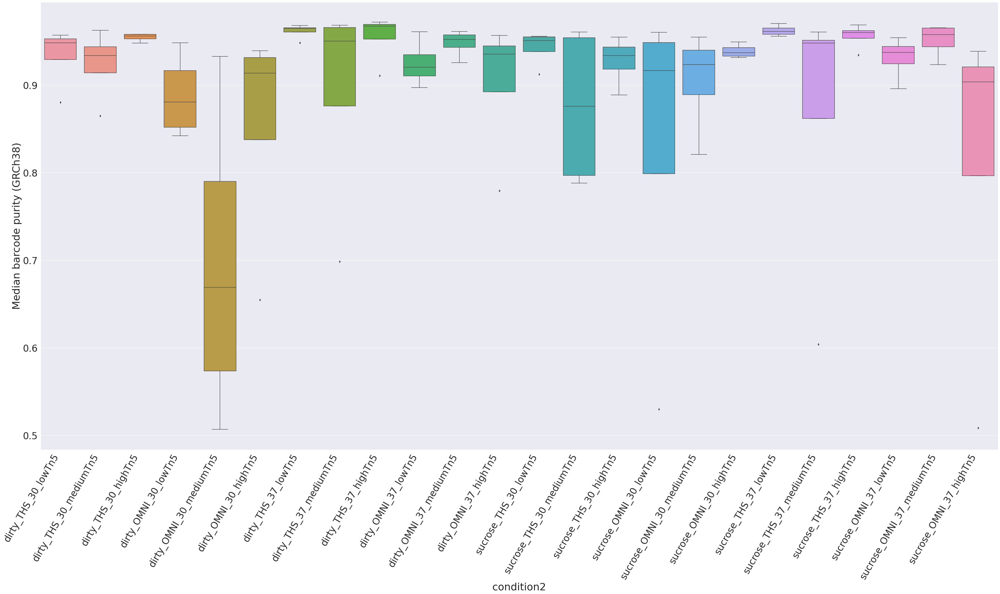

In [34]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Median barcode purity (GRCh38)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


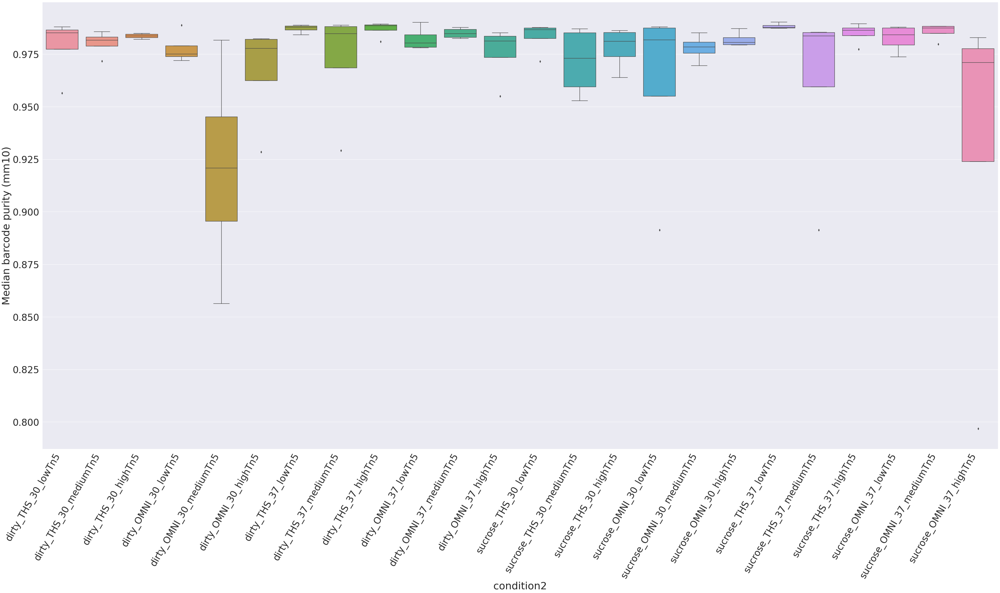

In [35]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Median barcode purity (mm10)')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.718239)


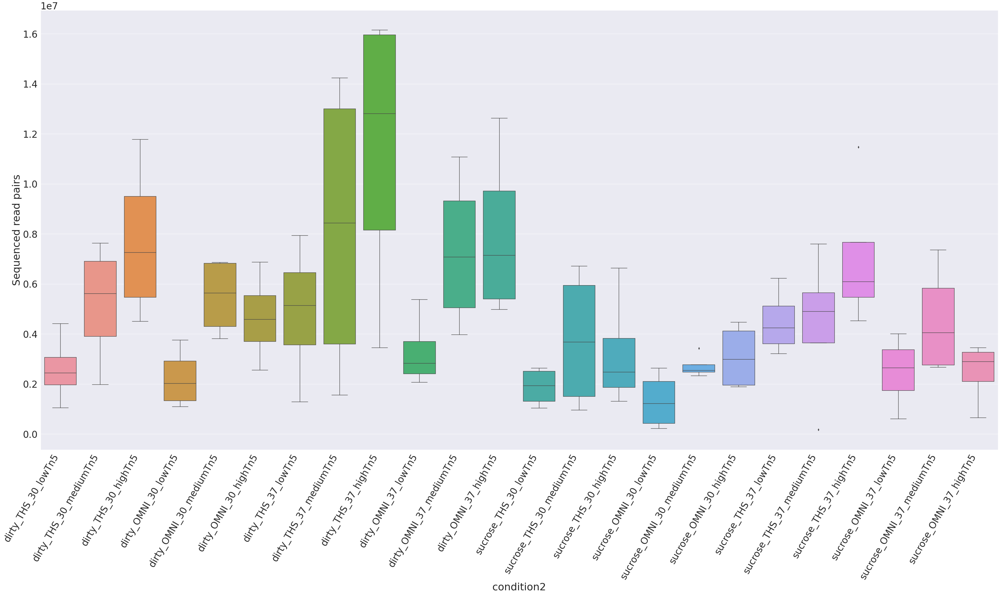

In [36]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'Sequenced read pairs')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0517743,0.250335;0.937426x0.731665)


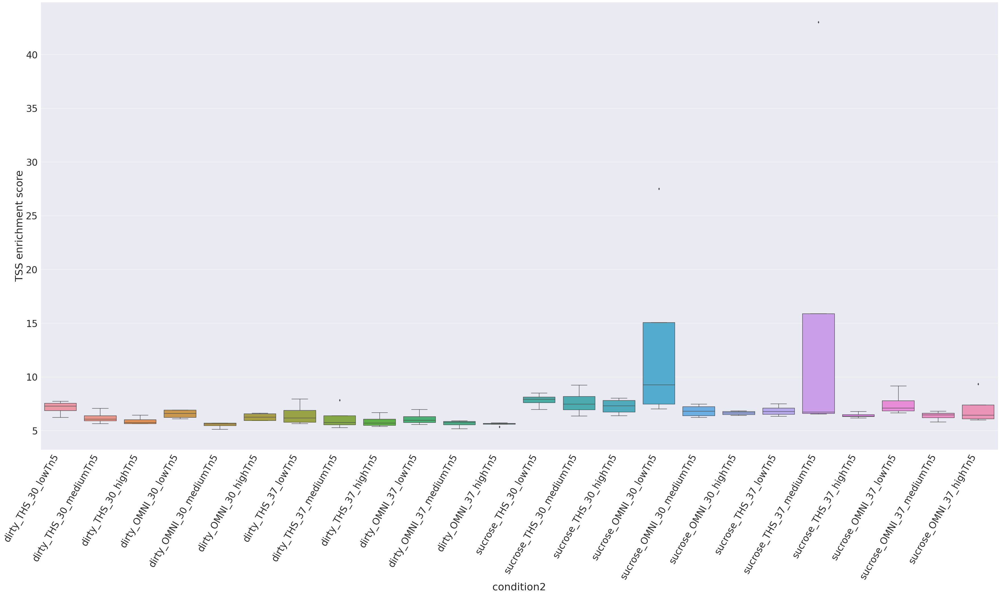

In [37]:
plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = subset, x = "condition2", y = 'TSS enrichment score')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

In [38]:
subset.columns

Index(['Sample ID', 'Genome', 'Pipeline version',
       'Estimated number of cells (GRCh38)',
       'Estimated number of cells (mm10)', 'Confidently mapped read pairs',
       'Estimated bulk library complexity', 'Fraction of genome in peaks',
       'Fraction of high-quality fragments in cells',
       'Fraction of high-quality fragments overlapping TSS (GRCh38)',
       'Fraction of high-quality fragments overlapping TSS (mm10)',
       'Fraction of high-quality fragments overlapping peaks (GRCh38)',
       'Fraction of high-quality fragments overlapping peaks (mm10)',
       'Fraction of transposition events in peaks in cells',
       'Fragments flanking a single nucleosome',
       'Fragments in nucleosome-free regions', 'Inferred multiplet rate',
       'Mean raw read pairs per cell (GRCh38)',
       'Mean raw read pairs per cell (mm10)', 'Median barcode purity (GRCh38)',
       'Median barcode purity (mm10)',
       'Median high-quality fragments per cell (GRCh38)',
       'Med

In [39]:

summary_path = '/home/dmakosa/working_data_02/snoverATAC/RL4632_3210peaks/summary_csvs/combined_summary.csv'
# Read in the dependencies
summary = pd.read_csv(summary_path, sep = ',')

In [40]:
summary

,Sample ID,Genome,Pipeline version,Estimated number of cells (GRCh38),Estimated number of cells (mm10),Confidently mapped read pairs,Estimated bulk library complexity,Fraction of genome in peaks,Fraction of high-quality fragments in cells,Fraction of high-quality fragments overlapping TSS (GRCh38),...,Percent duplicates,Q30 bases in barcode,Q30 bases in read 1,Q30 bases in read 2,Q30 bases in sample index i1,Sequenced read pairs,Sequencing saturation,TSS enrichment score,Unmapped read pairs,Valid barcodes
0,RL4632_96_Mouse_ctx_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,831,1014,0.8601,26898638.5,0.0557,0.5166,0.1677,...,0.1547,0.8776,0.9220,0.9062,NaN,9227484,0.2384,7.5478,0.0183,0.9905
1,RL4632_95_MIX_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,519,651,0.8482,NaN,0.0557,0.3737,0.1770,...,0.1508,0.8758,0.9248,0.9077,NaN,8108625,NaN,5.6196,0.0189,0.9911
2,RL4632_94_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,967,1926,0.8281,22071758.5,0.0557,0.2307,0.1630,...,0.1430,0.8808,0.9215,0.9066,NaN,7540740,0.2228,4.9652,0.0262,0.9907
3,RL4632_93_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,696,420,0.8090,NaN,0.0557,0.3227,0.1861,...,0.1507,0.8790,0.9171,0.9050,NaN,3476316,NaN,5.1264,0.0469,0.9902
4,RL4632_92_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,760,517,0.8410,22945973.0,0.0557,0.4237,0.1832,...,0.1489,0.8791,0.9220,0.9055,NaN,7956227,0.2298,4.2607,0.0169,0.9897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RL4632_05_MIX_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,434,321,0.8453,22699645.1,0.0557,0.2691,0.1521,...,0.1545,0.8793,0.9239,0.9053,NaN,7970263,0.2384,4.6484,0.0157,0.9915
92,RL4632_04_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,1032,410,0.8376,29310658.0,0.0557,0.4637,0.1638,...,0.1588,0.8802,0.9243,0.9043,NaN,10700542,0.2437,3.7740,0.0188,0.9908
93,RL4632_03_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,899,400,0.8446,30521821.8,0.0557,0.4596,0.1612,...,0.1575,0.8799,0.9249,0.9078,NaN,10968223,0.2433,3.3851,0.0131,0.9916
94,RL4632_02_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,883,664,0.8432,29450847.4,0.0557,0.4708,0.1632,...,0.1559,0.8783,0.9246,0.9044,NaN,10476010,0.2396,3.5753,0.0138,0.9914


In [41]:
summary[['RL', 'WellNumber', 'SpecieWell', 'SampleNumber','NucleiIsolationBuffer', 'TagBuffer']] = summary['Sample ID'].str.split("_", expand = True)
summary

,Sample ID,Genome,Pipeline version,Estimated number of cells (GRCh38),Estimated number of cells (mm10),Confidently mapped read pairs,Estimated bulk library complexity,Fraction of genome in peaks,Fraction of high-quality fragments in cells,Fraction of high-quality fragments overlapping TSS (GRCh38),...,Sequencing saturation,TSS enrichment score,Unmapped read pairs,Valid barcodes,RL,WellNumber,SpecieWell,SampleNumber,NucleiIsolationBuffer,TagBuffer
0,RL4632_96_Mouse_ctx_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,831,1014,0.8601,26898638.5,0.0557,0.5166,0.1677,...,0.2384,7.5478,0.0183,0.9905,RL4632,96,Mouse,ctx,Homogen,TagBufferB
1,RL4632_95_MIX_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,519,651,0.8482,NaN,0.0557,0.3737,0.1770,...,NaN,5.6196,0.0189,0.9911,RL4632,95,MIX,5609,Homogen,TagBufferB
2,RL4632_94_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,967,1926,0.8281,22071758.5,0.0557,0.2307,0.1630,...,0.2228,4.9652,0.0262,0.9907,RL4632,94,Human,5609,Homogen,TagBufferB
3,RL4632_93_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,696,420,0.8090,NaN,0.0557,0.3227,0.1861,...,NaN,5.1264,0.0469,0.9902,RL4632,93,Human,5609,Homogen,TagBufferB
4,RL4632_92_Human_5609_Homogen_TagBufferB,GRCh38_and_mm10,cellranger-atac-2.0.0,760,517,0.8410,22945973.0,0.0557,0.4237,0.1832,...,0.2298,4.2607,0.0169,0.9897,RL4632,92,Human,5609,Homogen,TagBufferB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RL4632_05_MIX_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,434,321,0.8453,22699645.1,0.0557,0.2691,0.1521,...,0.2384,4.6484,0.0157,0.9915,RL4632,05,MIX,5580,10xLysis,THS
92,RL4632_04_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,1032,410,0.8376,29310658.0,0.0557,0.4637,0.1638,...,0.2437,3.7740,0.0188,0.9908,RL4632,04,Human,5580,10xLysis,THS
93,RL4632_03_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,899,400,0.8446,30521821.8,0.0557,0.4596,0.1612,...,0.2433,3.3851,0.0131,0.9916,RL4632,03,Human,5580,10xLysis,THS
94,RL4632_02_Human_5580_10xLysis_THS,GRCh38_and_mm10,cellranger-atac-2.0.0,883,664,0.8432,29450847.4,0.0557,0.4708,0.1632,...,0.2396,3.5753,0.0138,0.9914,RL4632,02,Human,5580,10xLysis,THS


In [42]:
summary['condition'] = summary['NucleiIsolationBuffer'] + '_' + summary['TagBuffer']

In [44]:
summary['condition2'] = summary['SpecieWell'] + '_' + summary['NucleiIsolationBuffer'] + '_' + summary['TagBuffer']

AxesSubplot(0.0385431,0.190294;0.950657x0.791706)


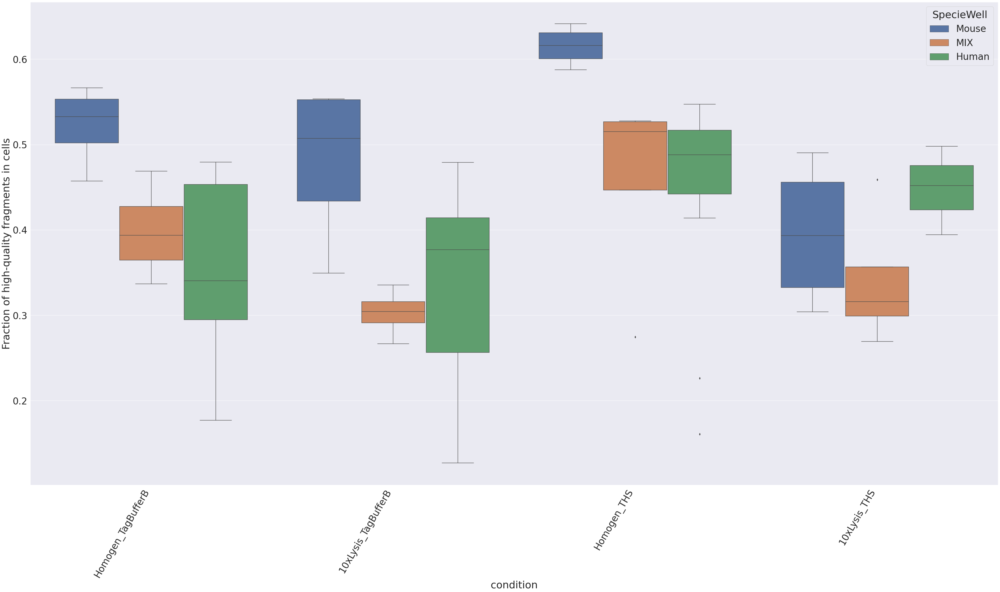

In [48]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments in cells', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0443764,0.190294;0.944824x0.791706)


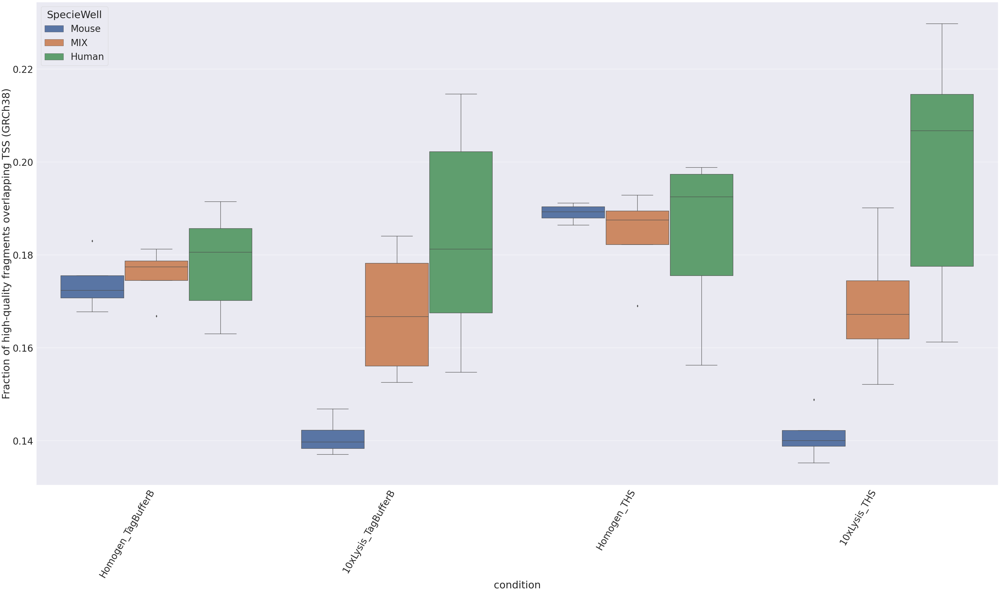

In [47]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments overlapping TSS (GRCh38)', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0443764,0.190294;0.944824x0.791706)


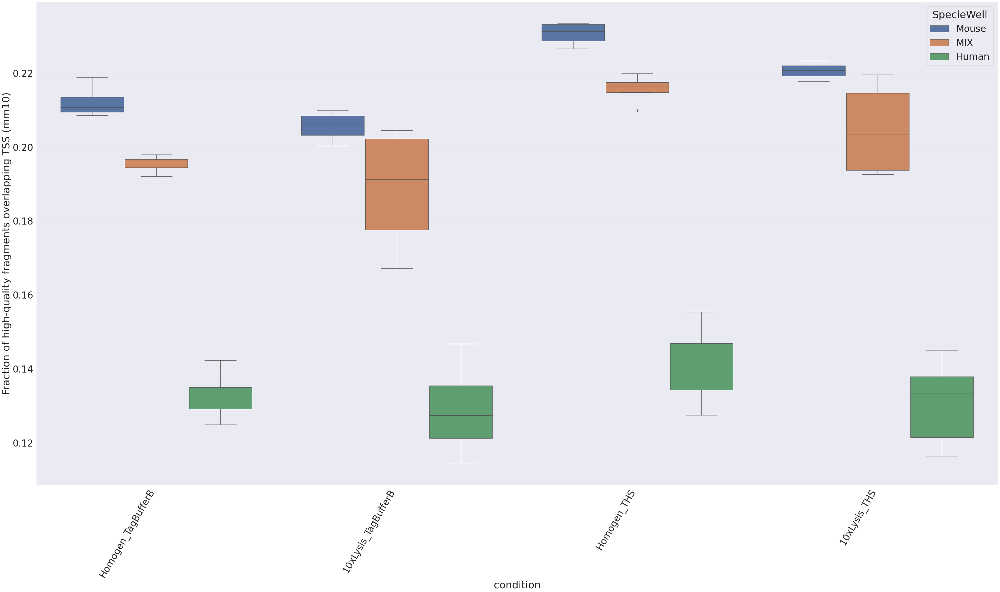

In [49]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments overlapping TSS (mm10)', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0443764,0.190294;0.944824x0.791706)


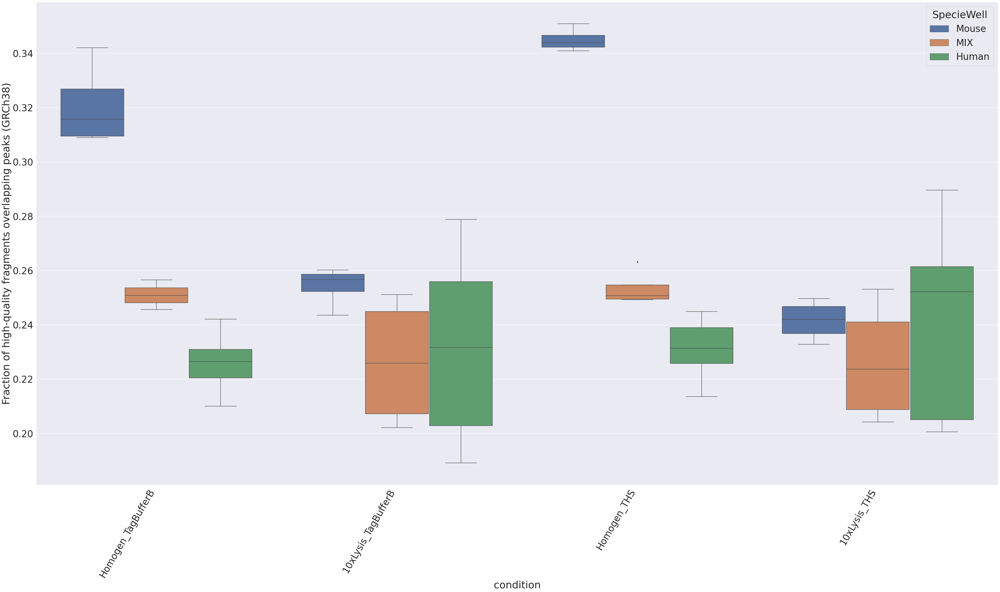

In [50]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments overlapping peaks (GRCh38)', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0443764,0.190294;0.944824x0.791706)


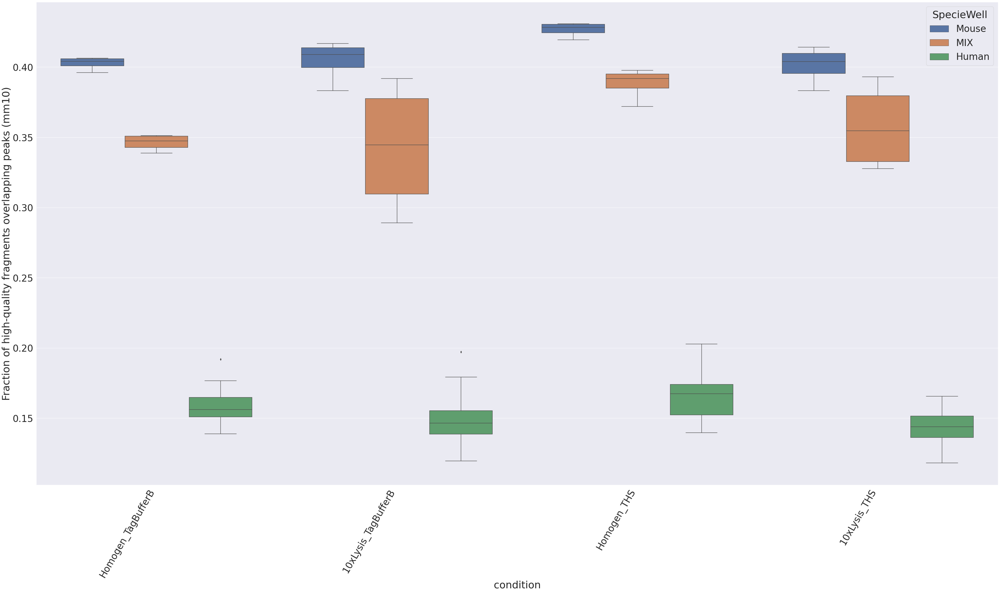

In [51]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Fraction of high-quality fragments overlapping peaks (mm10)', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0443764,0.190294;0.944824x0.786066)


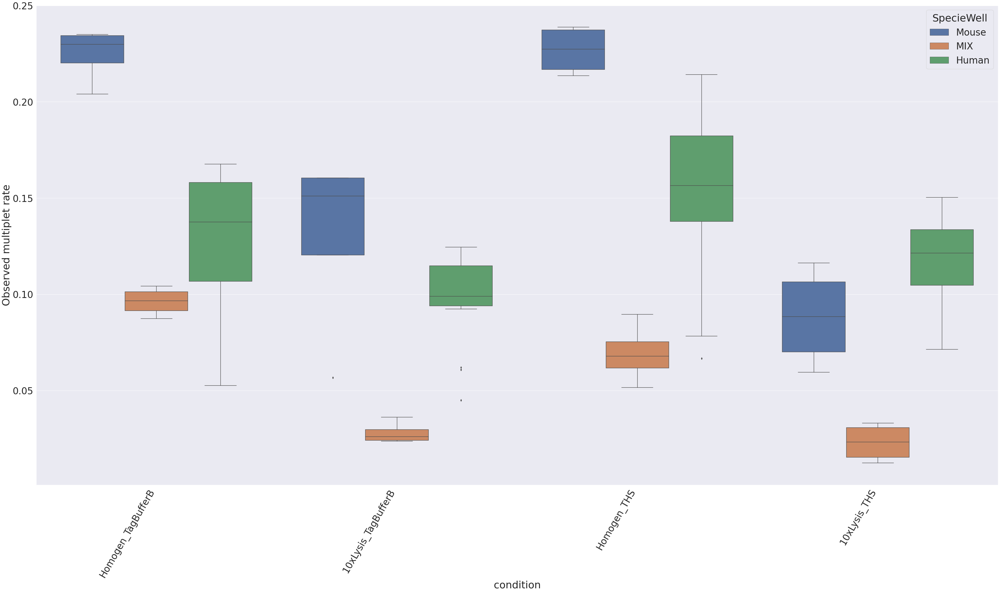

In [52]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Observed multiplet rate', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0502097,0.190294;0.93899x0.791706)


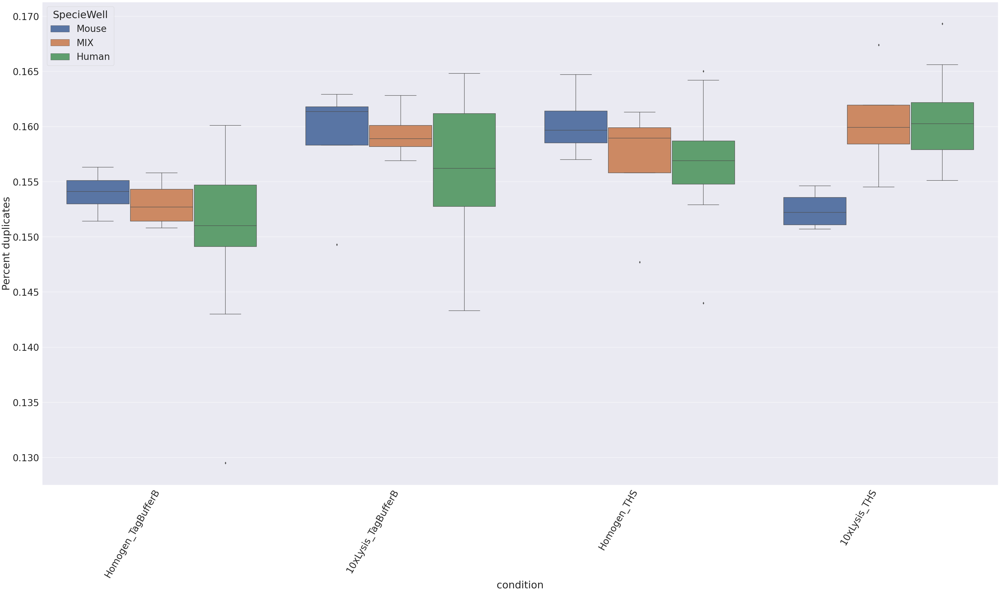

In [53]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'Percent duplicates', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

AxesSubplot(0.0298278,0.190294;0.959372x0.791706)


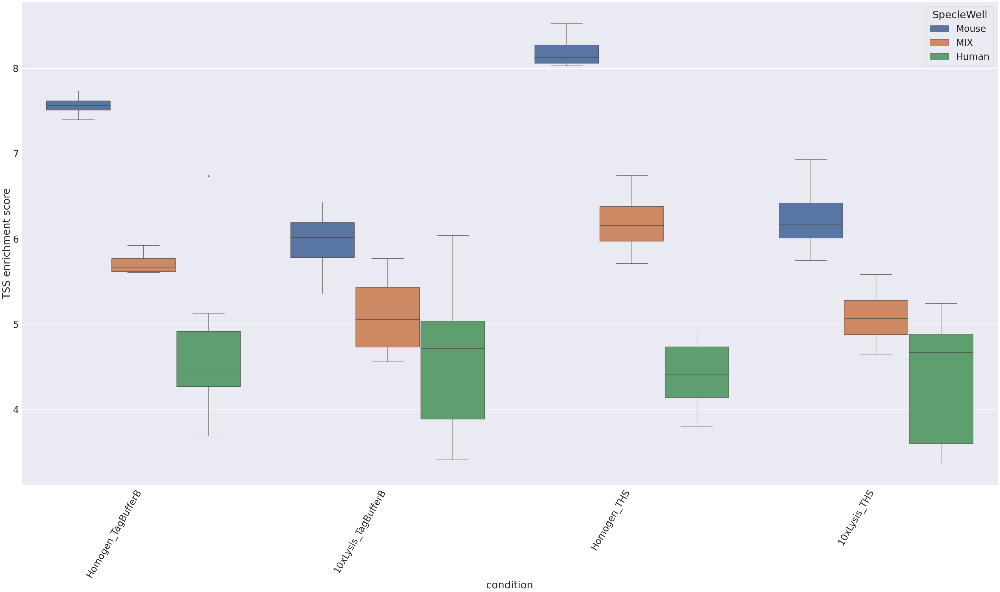

In [54]:

plt.rcParams['figure.figsize'] = [50, 30]
sns.set_style("white")
sns.set(font_scale=3)
g = sns.boxplot(data = summary, x = "condition", y = 'TSS enrichment score', hue = 'SpecieWell')
plt.xticks(rotation=60, horizontalalignment='right')
g.figure.tight_layout()
print(g)

In [46]:
summary.columns

Index(['Sample ID', 'Genome', 'Pipeline version',
       'Estimated number of cells (GRCh38)',
       'Estimated number of cells (mm10)', 'Confidently mapped read pairs',
       'Estimated bulk library complexity', 'Fraction of genome in peaks',
       'Fraction of high-quality fragments in cells',
       'Fraction of high-quality fragments overlapping TSS (GRCh38)',
       'Fraction of high-quality fragments overlapping TSS (mm10)',
       'Fraction of high-quality fragments overlapping peaks (GRCh38)',
       'Fraction of high-quality fragments overlapping peaks (mm10)',
       'Fraction of transposition events in peaks in cells',
       'Fragments flanking a single nucleosome',
       'Fragments in nucleosome-free regions', 'Inferred multiplet rate',
       'Mean raw read pairs per cell (GRCh38)',
       'Mean raw read pairs per cell (mm10)', 'Median barcode purity (GRCh38)',
       'Median barcode purity (mm10)',
       'Median high-quality fragments per cell (GRCh38)',
       'Med